In [1]:
import pandas as pd

In [2]:
timeserise_revenue = pd.read_csv('time_serise_revenue.csv')

# sales_data = pd.read_csv('time_serise_sale.csv')

timeserise_revenue.head()

,Unnamed: 0,day_1,day_2,day_3,day_4,day_5,day_6,day_7,day_8,day_9,...,day_51,day_52,day_53,day_54,day_55,day_56,day_57,day_58,day_59,day_60
0,0,2.622866,2.657832,2.771121,2.815845,2.876267,2.859229,2.844758,2.793797,2.736443,...,1.228701,1.290414,1.474886,1.563295,1.736197,1.797285,1.978940,2.198979,2.277908,2.403300
1,1,2.057578,2.089561,2.138827,2.189964,2.224312,2.213340,2.197103,2.079228,2.072745,...,1.880965,1.869619,1.872043,1.854963,1.846967,1.878265,1.868918,1.877923,1.975341,1.959734
2,2,2.485055,2.349254,2.284784,2.142335,2.048803,1.990668,1.965783,1.866983,1.816916,...,2.714773,2.792819,2.788505,2.879778,2.873212,2.854421,2.863193,2.773218,2.708913,2.590657
3,3,2.053928,2.121919,2.148003,2.179574,2.161062,2.124168,2.153791,2.097816,1.953759,...,1.861072,1.875642,1.782617,1.768666,1.876252,1.815870,1.870878,1.923176,2.025993,2.048272
4,4,1.702631,1.825995,2.038047,2.194083,2.313903,2.417883,2.567613,2.650782,2.729691,...,1.258760,1.137150,1.109007,1.104999,1.150137,1.204513,1.221350,1.327023,1.387304,1.557363


In [3]:
timeserise_revenue = timeserise_revenue.set_index('Unnamed: 0')
timeserise_revenue.index.name = None
timeserise_revenue.head()

,day_1,day_2,day_3,day_4,day_5,day_6,day_7,day_8,day_9,day_10,...,day_51,day_52,day_53,day_54,day_55,day_56,day_57,day_58,day_59,day_60
0,2.622866,2.657832,2.771121,2.815845,2.876267,2.859229,2.844758,2.793797,2.736443,2.655966,...,1.228701,1.290414,1.474886,1.563295,1.736197,1.797285,1.978940,2.198979,2.277908,2.403300
1,2.057578,2.089561,2.138827,2.189964,2.224312,2.213340,2.197103,2.079228,2.072745,1.951091,...,1.880965,1.869619,1.872043,1.854963,1.846967,1.878265,1.868918,1.877923,1.975341,1.959734
2,2.485055,2.349254,2.284784,2.142335,2.048803,1.990668,1.965783,1.866983,1.816916,1.816590,...,2.714773,2.792819,2.788505,2.879778,2.873212,2.854421,2.863193,2.773218,2.708913,2.590657
3,2.053928,2.121919,2.148003,2.179574,2.161062,2.124168,2.153791,2.097816,1.953759,1.962948,...,1.861072,1.875642,1.782617,1.768666,1.876252,1.815870,1.870878,1.923176,2.025993,2.048272
4,1.702631,1.825995,2.038047,2.194083,2.313903,2.417883,2.567613,2.650782,2.729691,2.876534,...,1.258760,1.137150,1.109007,1.104999,1.150137,1.204513,1.221350,1.327023,1.387304,1.557363


In [6]:
import matplotlib.pyplot as plt

In [7]:
import torch
import torch.nn as nn #nn是torch的neural network
import numpy as np

In [8]:
# 建立一个全连接模型
# 每个pytorch的model必须得是pytorch的一个子类，因为要进行forward，调整参数等
class FullyConnected(nn.Module):
    def __init__(self, x_size, hidden_size, output_size): # 输入n*10,hidden layer,输出n*10
        # super() 函数是用于调用父类(超类)的一个方法。super() 是用来解决多重继承问题的
        super(FullyConnected, self).__init__() # 父类里有初始化非方法，在定义新的的时候，要让父类初始化。
        self.hidden_size = hidden_size

        self.linear_with_tanh = nn.Sequential( # 两层神经网络
            nn.Linear(x_size, self.hidden_size), # 线性变换 wx+b
            nn.Tanh(), # 非线性变换，激活函数
            nn.Linear(self.hidden_size, self.hidden_size),
            nn.Tanh(),
            nn.Linear(self.hidden_size, output_size)
        )
        
    def forward(self, x):
        yhat = self.linear_with_tanh(x)
        
        return yhat

In [9]:
from torch import optim 

In [10]:
# 随机取sample_size个数据
def sample_from_table(sample_size, dataframe):
    sample_row = dataframe.sample().values[0]
    
    begin_column = random.randint(0, len(sample_row) - sample_size - 1) 
    
    choosen_data = sample_row[begin_column:begin_column+sample_size+1]
    
    return (choosen_data[:sample_size], choosen_data[1:])

In [11]:
import random

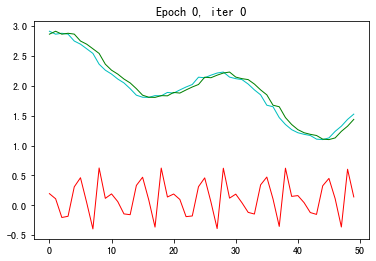

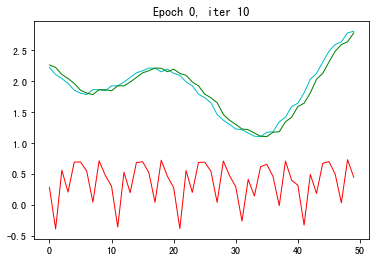

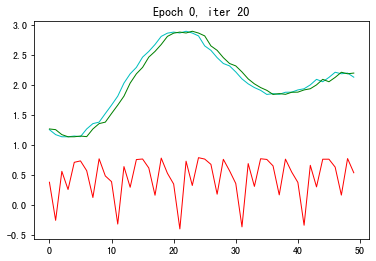

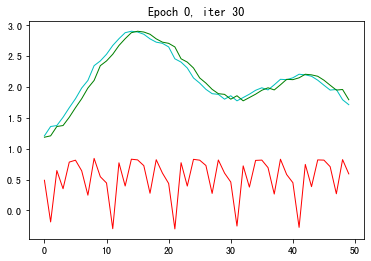

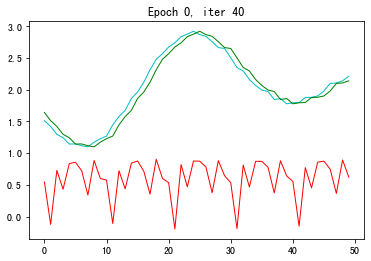

...

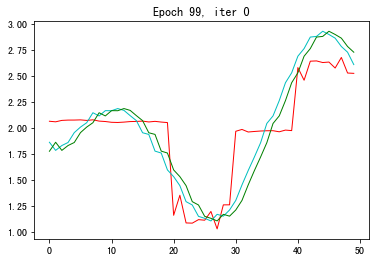

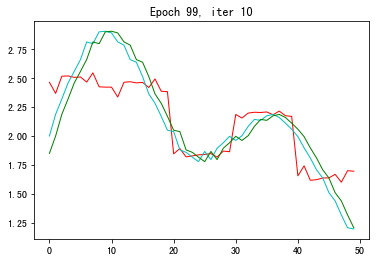

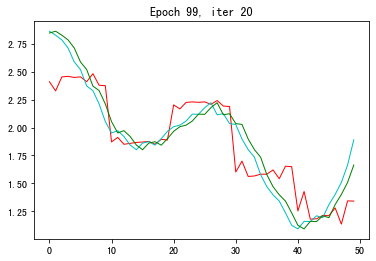

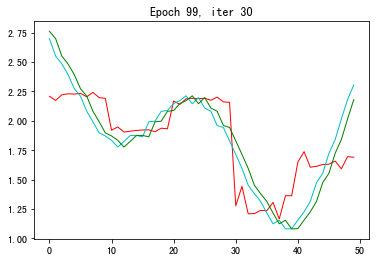

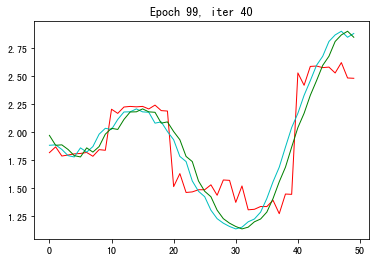

In [13]:
fc_model = FullyConnected(x_size=10, hidden_size=3, output_size=10)
fc_model = fc_model.double()

criterion = nn.MSELoss() # LOSS

# 除了梯度下降，还有很多别的优化方法，此处用的SGD
optimizer = optim.SGD(fc_model.parameters(),lr=0.01)

n_epochs = 100

losses = np.zeros(n_epochs)

n_iters = 50


for epoch in range(n_epochs):
    for iter_ in range(n_iters):
        inputs_,targets_ = sample_from_table(50, timeserise_revenue)

        inputs = torch.from_numpy(np.array([
                        inputs_[0:10], 
                        inputs_[10:20], 
                        inputs_[20:30], 
                        inputs_[30:40], 
                        inputs_[40:50]], dtype=np.double)) # 输入

        targets = torch.from_numpy(np.array([
                        targets_[0:10], 
                        targets_[10:20], 
                        targets_[20:30], 
                        targets_[30:40], 
                        targets_[40:50]], dtype=np.double)) # 输出

        outputs = fc_model(inputs) # yhat

        loss = criterion(outputs,targets) # loss

        # torch在训练的时候，会默认在每一轮训练的时候，把上一轮训练的梯度留下来，下一次求得的梯度加上它形成新的梯度，某些情况适用，此处不需要
        # 梯度清零，不然会出错
        optimizer.zero_grad() 

        loss.backward() # 反向传播

        optimizer.step() # 更新权值

        losses[epoch] += loss # 对比前边，更改了loss增加的方式

        if iter_ % 10 == 0:
            plt.clf()
            plt.ion()

            plt.title("Epoch {}, iter {}".format(epoch, iter_))

            plt.plot(torch.flatten(outputs.detach()),'r-',linewidth=1,label='Output') # 预测数据 - 红色
            plt.plot(torch.flatten(targets),'c-',linewidth=1,label='Label') # 真实数据 - 浅蓝
            plt.plot(torch.flatten(inputs),'g-',linewidth=1,label='Input') # 输入数据 - 绿色

            plt.draw();
            plt.pause(0.05);

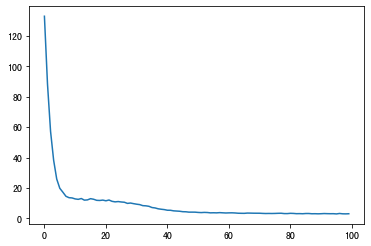

In [14]:
plt.plot(losses)

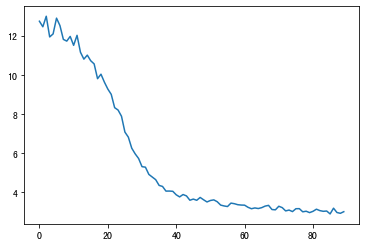

In [15]:
plt.plot(losses[10:])